<a href="https://colab.research.google.com/github/yaolihua081/AIG_PC/blob/main/APTprediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Read in the APT data

In [26]:
'''
Step 1
Loading Gensim（for LDAmodels ) and nltk libraries
'''
# pip install gensim
# Gensim
import gensim,spacy
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim import models, corpora

import re, numpy as np, pandas as pd
np.random.seed(400)
import matplotlib.pyplot as plt

# NLTK Stop words
import nltk
from nltk.stem import WordNetLemmatizer, SnowballStemmer,PorterStemmer
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
stemmer = SnowballStemmer("english")
porter=PorterStemmer()
nltk.download('wordnet')
STOPWORDS = stopwords.words('english')
#STOPWORDS.extend(['passage','from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])
STOPWORDS.extend(['according','passage', 're', 'not', 'could', '_', ])

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, HashingVectorizer
from sklearn.metrics.pairwise import cosine_similarity
#from sklearn.datasets import fetch_20newsgroups
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.svm import SVC

from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN, Flatten
from keras.layers.embeddings import Embedding
from keras.layers.convolutional import Conv1D, MaxPooling1D
from numpy import loadtxt
from keras.layers import Dense

from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [4]:
'''
Step 1, upload files
'''
#!pip install kaggle
from google.colab import files
files.upload()


Saving APTALLDifficulty7E20210818.txt to APTALLDifficulty7E20210818.txt
Saving APTALLDifficulty8E20210818.txt to APTALLDifficulty8E20210818.txt


{'APTALLDifficulty7E20210818.txt': b'Rwo for 1306        \r\nsample size  1306         235          items, Gender-Ethnic-Race-Form-SSN\r\nItem difficulties, responses, theta estimate, predicted AFQT,AFQT,SSN \r\n    .       .       .       .       .       .       .       .     -0.873    .     -0.566    .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .     -0.213    .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .       .     -0.162    .       .       .       .       .       .       .       .       .       .      0.241   0.858   0.250    .       .       .       .       .       .       .       .       .       .      0.070    .       .       .       .       .       .       .       .       .       .       .       .     -0.122    .       .      0.590    

In [5]:
import re, numpy as np, pandas as pd
#APTResp=pd.read_csv('APTALLRESPONSE20210802.txt',delimiter = "\t")
resp_names=['Resp'+str(i) for i in range(235)]
resp_names.extend(["AR", "WK","PC","MK","PAFQT","AFQT","SSN","Form"])
#names=[resp_names, "AR", "WK","PC","MK","PAFQT","AFQT","SSN"]
df7 = pd.read_fwf('APTALLRESPONSE7E20210818.txt',skiprows=3,sep=" ", lheader=None,names=resp_names)
df8 = pd.read_fwf('APTALLRESPONSE8E20210818.txt',skiprows=3,sep=" ", lheader=None,names=resp_names)
df7
df7['test']=0
df8['test']=1
df=pd.concat([df7,df8],axis=0)
df

,Resp0,Resp1,Resp2,Resp3,Resp4,Resp5,Resp6,Resp7,Resp8,Resp9,Resp10,Resp11,Resp12,Resp13,Resp14,Resp15,Resp16,Resp17,Resp18,Resp19,Resp20,Resp21,Resp22,Resp23,Resp24,Resp25,Resp26,Resp27,Resp28,Resp29,Resp30,Resp31,Resp32,Resp33,Resp34,Resp35,Resp36,Resp37,Resp38,Resp39,...,Resp204,Resp205,Resp206,Resp207,Resp208,Resp209,Resp210,Resp211,Resp212,Resp213,Resp214,Resp215,Resp216,Resp217,Resp218,Resp219,Resp220,Resp221,Resp222,Resp223,Resp224,Resp225,Resp226,Resp227,Resp228,Resp229,Resp230,Resp231,Resp232,Resp233,Resp234,AR,WK,PC,MK,PAFQT,AFQT,SSN,Form,test
0,F,F,F,F,F,F,F,F,1,F,0,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1,F,F,F,1,F,F,F,F,F,F,F,F,F,F,-0.404,-0.815,0.410,-0.540,16.0,48.0,1477969,07E,0
1,F,F,1,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,0,F,F,1,0,F,F,0,1,F,F,F,F,F,F,F,0,1,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,0,0,F,F,F,F,F,F,F,F,F,F,F,0.035,0.529,1.068,0.079,44.0,76.0,2901499,07E,0
2,F,F,F,1,F,F,F,F,F,F,F,F,1,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,0,F,F,F,F,F,F,F,F,F,F,F,0.970,0.745,0.593,0.650,69.0,57.0,2983391,07E,0
3,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1,1,F,1,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,0,1,0,F,F,F,F,F,F,F,F,F,F,F,0,F,F,F,F,F,F,F,F,F,F,F,F,1.440,0.388,1.049,1.588,93.0,96.0,4042440,07E,0
4,F,F,F,F,F,F,F,1,F,1,F,F,F,F,F,1,F,F,F,F,F,F,F,F,F,F,F,F,F,0,0,F,F,1,F,F,F,F,F,F,...,F,F,F,F,F,1,0,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,0.692,0.471,1.002,0.118,60.0,57.0,4048224,07E,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4301,F,F,F,F,1,F,F,F,1,F,1,F,F,1,F,F,F,F,F,F,F,F,F,F,F,0,1,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1,F,F,F,F,1,F,F,F,F,F,F,F,F,F,0.129,0.507,0.081,1.227,45.0,24.0,890527904,06E,1
4302,F,F,F,F,1,F,F,F,F,F,1,F,1,1,0,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,1,F,F,F,F,F,F,F,F,F,F,F,F,1,F,F,F,F,F,F,F,F,F,-0.476,0.116,0.522,1.270,36.0,46.0,890853460,08E,1
4303,F,F,F,F,F,F,F,1,F,F,1,F,1,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1,0,...,F,F,F,F,F,F,F,F,F,F,F,F,F,1,F,F,0,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1.415,-0.994,0.437,1.179,70.0,67.0,892261628,09E,1
4304,1,F,F,F,F,F,F,F,F,F,F,F,1,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1,1,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1,F,F,F,F,F,1,F,F,F,F,F,F,F,F,-0.305,-0.504,0.338,1.245,34.0,63.0,894162599,09E,1


In [6]:
column_names=['Difficulty'+str(i) for i in range(235)]
#column_names.append('AFQT')
column_names.extend(["AR", "WK","PC","MK","PAFQT","AFQT","SSN","Form"])
difficulty7 = pd.read_fwf('APTALLDifficulty7E20210818.txt',skiprows=3, sep=" ",lheader=None,names=column_names)
difficulty8 = pd.read_fwf('APTALLDifficulty8E20210818.txt',skiprows=3, sep=" ",lheader=None,names=column_names)
difficulty7['test']=0
difficulty8['test']=1

difficulty=pd.concat([difficulty7,difficulty8],axis=0)

difficulty

,Difficulty0,Difficulty1,Difficulty2,Difficulty3,Difficulty4,Difficulty5,Difficulty6,Difficulty7,Difficulty8,Difficulty9,Difficulty10,Difficulty11,Difficulty12,Difficulty13,Difficulty14,Difficulty15,Difficulty16,Difficulty17,Difficulty18,Difficulty19,Difficulty20,Difficulty21,Difficulty22,Difficulty23,Difficulty24,Difficulty25,Difficulty26,Difficulty27,Difficulty28,Difficulty29,Difficulty30,Difficulty31,Difficulty32,Difficulty33,Difficulty34,Difficulty35,Difficulty36,Difficulty37,Difficulty38,Difficulty39,...,Difficulty204,Difficulty205,Difficulty206,Difficulty207,Difficulty208,Difficulty209,Difficulty210,Difficulty211,Difficulty212,Difficulty213,Difficulty214,Difficulty215,Difficulty216,Difficulty217,Difficulty218,Difficulty219,Difficulty220,Difficulty221,Difficulty222,Difficulty223,Difficulty224,Difficulty225,Difficulty226,Difficulty227,Difficulty228,Difficulty229,Difficulty230,Difficulty231,Difficulty232,Difficulty233,Difficulty234,AR,WK,PC,MK,PAFQT,AFQT,SSN,Form,test
0,.,.,.,.,.,.,.,.,-0.873,.,-0.566,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,-0.213,.,.,.,.,.,.,...,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,-0.205,.,.,.,-0.006,.,.,.,.,.,.,.,.,.,.,-0.404,-0.815,0.410,-0.540,16.0,48.0,1477969,07E,0
1,.,.,-0.238,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0.402,.,.,0.367,0.282,.,.,0.455,-1.114,.,.,.,.,.,.,.,0.180,0.536,...,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0.528,1.023,.,.,.,.,.,.,.,.,.,.,.,0.035,0.529,1.068,0.079,44.0,76.0,2901499,07E,0
2,.,.,.,0.584,.,.,.,.,.,.,.,.,0.762,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,...,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,1.023,.,.,.,.,.,.,.,.,.,.,.,0.970,0.745,0.593,0.650,69.0,57.0,2983391,07E,0
3,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0.621,-0.310,.,0.568,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,...,.,.,.,.,0.418,0.488,-2.511,.,.,.,.,.,.,.,.,.,.,.,0.528,.,.,.,.,.,.,.,.,.,.,.,.,1.440,0.388,1.049,1.588,93.0,96.0,4042440,07E,0
4,.,.,.,.,.,.,.,-0.127,.,0.257,.,.,.,.,.,-0.617,.,.,.,.,.,.,.,.,.,.,.,.,.,0.455,-1.114,.,.,-0.213,.,.,.,.,.,.,...,.,.,.,.,.,0.488,-2.511,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0.692,0.471,1.002,0.118,60.0,57.0,4048224,07E,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4301,.,.,.,.,-0.004,.,.,.,-0.873,.,-0.566,.,.,-1.124,.,.,.,.,.,.,.,.,.,.,.,0.367,0.282,.,.,.,.,.,.,.,.,.,.,.,.,.,...,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,-0.205,.,.,.,.,1.053,.,.,.,.,.,.,.,.,.,0.129,0.507,0.081,1.227,45.0,24.0,890527904,06E,1
4302,.,.,.,.,-0.004,.,.,.,.,.,-0.566,.,0.762,-1.124,0.530,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,...,.,.,.,.,.,.,.,.,0.396,.,.,.,.,.,.,.,.,.,.,.,.,1.053,.,.,.,.,.,.,.,.,.,-0.476,0.116,0.522,1.270,36.0,46.0,890853460,08E,1
4303,.,.,.,.,.,.,.,-0.127,.,.,-0.566,.,0.762,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,0.180,0.536,...,.,.,.,.,.,.,.,.,.,.,.,.,.,0.922,.,.,-0.205,.,.,.,.,.,.,.,.,.,.,.,.,.,.,1.415,-0.994,0.437,1.179,70.0,67.0,892261628,09E,1
4304,-0.578,.,.,.,.,.,.,.,.,.,.,.,0.762,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,-0.028,-1.688,.,.,.,...,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,.,-0.205,.,.,.,.,.,-1.148,.,.,.,.,.,.,.,.,-0.305,-0.504,0.338,1.245,34.0,63.0,894162599,09E,1


In [ ]:
import re, numpy as np, pandas as pd
#APTResp=pd.read_csv('APTALLRESPONSE20210802.txt',delimiter = "\t")
resp_names=['Resp'+str(i) for i in range(2845)]
resp_names.extend(["AR", "WK","PC","MK","AFQT","SSN"])
#names=[resp_names, "AR", "WK","PC","MK","PAFQT","AFQT","SSN"]
#df = pd.read_fwf('ASVABALLRESPONSE20210802.txt',skiprows=3,sep=" ", lheader=None,names=resp_names)
df = pd.read_fwf('ASVAB20RESPONSE20210802.txt',skiprows=3,sep=" ", lheader=None,names=resp_names)
df

,Resp0,Resp1,Resp2,Resp3,Resp4,Resp5,Resp6,Resp7,Resp8,Resp9,Resp10,Resp11,Resp12,Resp13,Resp14,Resp15,Resp16,Resp17,Resp18,Resp19,Resp20,Resp21,Resp22,Resp23,Resp24,Resp25,Resp26,Resp27,Resp28,Resp29,Resp30,Resp31,Resp32,Resp33,Resp34,Resp35,Resp36,Resp37,Resp38,Resp39,...,Resp2811,Resp2812,Resp2813,Resp2814,Resp2815,Resp2816,Resp2817,Resp2818,Resp2819,Resp2820,Resp2821,Resp2822,Resp2823,Resp2824,Resp2825,Resp2826,Resp2827,Resp2828,Resp2829,Resp2830,Resp2831,Resp2832,Resp2833,Resp2834,Resp2835,Resp2836,Resp2837,Resp2838,Resp2839,Resp2840,Resp2841,Resp2842,Resp2843,Resp2844,AR,WK,PC,MK,AFQT,SSN
0,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,-0.069,0.286,-0.269,0.922,48.0,1477969
1,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,2.332,2.200,1.738,2.033,99.0,1807483
2,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,0.997,0.804,0.716,0.893,73.0,1866738
3,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,-0.363,-0.060,-0.386,-0.197,31.0,1920149
4,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,1.552,0.967,0.969,2.266,93.0,1963227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6477,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,0.129,-0.407,-0.581,0.471,35.0,893430972
6478,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,-0.278,0.012,0.114,0.766,47.0,893905430
6479,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,0.643,0.117,0.456,1.620,63.0,894162599
6480,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,...,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,F,-0.452,-1.103,-1.122,0.512,19.0,896285144


#Prepare data, split into train data , validation data, and test data, Run statistical Models

In [7]:
def ModifyData(dat, num):
  dat = dat.replace(np.nan, num)
  dat = dat.replace('.', num)
  dat = dat.replace('F', num)
  return dat
num=-9
Difficulty7=ModifyData(difficulty7, num) 
Difficulty8=ModifyData(difficulty8, num) 
Difficulty=ModifyData(difficulty, num) 

In [8]:
def ModifyData(dat, num):
  dat = dat.replace(np.nan, num)
  dat = dat.replace('.', num)
  dat = dat.replace('F', num)
  return dat
num=-9
#Difficulty=ModifyData(difficulty, num) 
num=-1
Response7=ModifyData(df7,num)
Response8=ModifyData(df8,num)
Response=ModifyData(df,num)

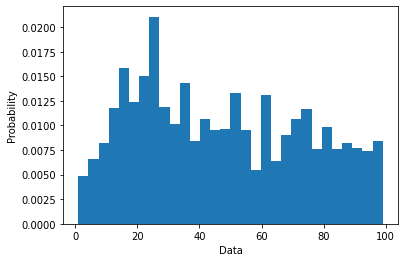

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
x=df['AFQT']
plt.hist(x, density=True, bins=30)  # density=False would make counts
plt.ylabel('Probability')
plt.xlabel('AFQT');

In [ ]:
from numpy.random import randn
from numpy.random import seed
from scipy.stats import spearmanr
from scipy.stats import pearsonr
# seed random number generator
x=df['AFQT'].values
y=df['PAFQT'].values
corr, _ = spearmanr(x, y)
#corr, _ = pearsonr(x, y)
print('Spearmans correlation: %.3f' % corr)

Spearmans correlation: nan


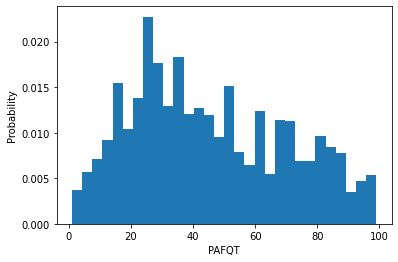

In [ ]:
x=df['PAFQT']
plt.hist(x, density=True, bins=30)  # density=False would make counts
plt.ylabel('Probability')
plt.xlabel('PAFQT');

In [ ]:
Response7.head()

,Resp0,Resp1,Resp2,Resp3,Resp4,Resp5,Resp6,Resp7,Resp8,Resp9,Resp10,Resp11,Resp12,Resp13,Resp14,Resp15,Resp16,Resp17,Resp18,Resp19,Resp20,Resp21,Resp22,Resp23,Resp24,Resp25,Resp26,Resp27,Resp28,Resp29,Resp30,Resp31,Resp32,Resp33,Resp34,Resp35,Resp36,Resp37,Resp38,Resp39,...,Resp205,Resp206,Resp207,Resp208,Resp209,Resp210,Resp211,Resp212,Resp213,Resp214,Resp215,Resp216,Resp217,Resp218,Resp219,Resp220,Resp221,Resp222,Resp223,Resp224,Resp225,Resp226,Resp227,Resp228,Resp229,Resp230,Resp231,Resp232,Resp233,Resp234,AR,WK,PC,MK,PAFQT,AFQT,SSN,Class31,Class50,Class
F,-1,-1,-1,-1,-1,-1,-1,1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-0.404,-0.815,0.410,-0.540,16.0,48,1477969,07E,1,1,2
F,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,1,0,-1,-1,0,1,-1,-1,-1,-1,-1,-1,-1,0,1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0.035,0.529,1.068,0.079,44.0,76,2901499,07E,1,1,2
F,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0.970,0.745,0.593,0.650,69.0,57,2983391,07E,1,1,2
F,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,0,1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1.440,0.388,1.049,1.588,93.0,96,4042440,07E,1,1,2
F,-1,-1,-1,-1,-1,-1,1,-1,1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0.692,0.471,1.002,0.118,60.0,57,4048224,07E,1,1,2


In [9]:
def classfy31(x):
  if x<31:
    Class31=0
  else:
    Class31=1
  return Class31
def classfy51(x):
  if x<50:
    Class50=0
  else:
    Class50=1       
  return Class50  
def classfy(x):
  if x<31:
    Class=0
  else:
    if x<50:
      Class=1
    else:
      Class=2  
  return Class
Response7['Class31']=Response7['AFQT'].apply(lambda x: classfy31(x))
Response7[ "Class50"]=Response7['AFQT'].apply(lambda x: classfy51(x))
Response7["Class"]=Response7['AFQT'].apply(lambda x: classfy(x))
Response8['Class31']=Response8['AFQT'].apply(lambda x: classfy31(x))
Response8[ "Class50"]=Response8['AFQT'].apply(lambda x: classfy51(x))
Response8["Class"]=Response8['AFQT'].apply(lambda x: classfy(x))

Response['Class31']=Response['AFQT'].apply(lambda x: classfy31(x))
Response[ "Class50"]=Response['AFQT'].apply(lambda x: classfy51(x))
Response["Class"]=Response['AFQT'].apply(lambda x: classfy(x))
#Difficulty['Class31']=Difficulty['AFQT'].apply(lambda x: classfy31(x))
#Difficulty["Class50"]=Difficulty['AFQT'].apply(lambda x: classfy51(x))
#Difficulty["Class"]=Difficulty['AFQT'].apply(lambda x: classfy(x))

In [10]:
Difficulty7['Class31']=Difficulty7['AFQT'].apply(lambda x: classfy31(x))
Difficulty7["Class50"]=Difficulty7['AFQT'].apply(lambda x: classfy51(x))
Difficulty7["Class"]=Difficulty7['AFQT'].apply(lambda x: classfy(x))
Difficulty8['Class31']=Difficulty8['AFQT'].apply(lambda x: classfy31(x))
Difficulty8["Class50"]=Difficulty8['AFQT'].apply(lambda x: classfy51(x))
Difficulty8["Class"]=Difficulty8['AFQT'].apply(lambda x: classfy(x))
Difficulty['Class31']=Difficulty['AFQT'].apply(lambda x: classfy31(x))
Difficulty["Class50"]=Difficulty['AFQT'].apply(lambda x: classfy51(x))
Difficulty["Class"]=Difficulty['AFQT'].apply(lambda x: classfy(x))

In [50]:
#column_names=['Resp'+str(i) for i in range(2845)] #235 for apt
column_names=['Resp'+str(i) for i in range(235)] #235 for apt
from sklearn.model_selection import train_test_split
def Train_Valid_TestSplit(dat,name, Label,state=100):
  X_scale=dat[name]
  Y=dat[Label]
  #Y=Y.tolist()
  X_train, X_val_and_test, Y_train, Y_val_and_test = train_test_split(X_scale, Y,random_state=state,test_size=0.3)
  X_val, X_test, Y_val, Y_test = train_test_split(X_val_and_test, Y_val_and_test,random_state=state, test_size=0.5)
  scaler.fit(X_train)
  X_train = scaler.transform(X_train)
  X_test = scaler.transform(X_test)
  X_val= scaler.transform(X_val)
 
  trY=Y_train
  trY=trY.tolist()
  trTxt=X_train
  

  vY=Y_val
  vY=vY.tolist()
  vTxt=X_val
  
  tY=Y_test
  tY=tY.tolist()
  tTxt=X_test

  return trTxt, trY,  tTxt, tY,  vTxt, vY


In [ ]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt


In [61]:
#column_names=['Resp'+str(i) for i in range(2845)]
column_names=['Resp'+str(i) for i in range(235)] #235 for apt
def ML(model, dat,name,Label,state=100):
  trX, trY,tX, tY, vX, vY=Train_Valid_TestSplit(dat,name, Label,state=100)
  
  if (model=='LRG'):
    para_seed = [(c, iter) for c in np.linspace(.01, 2, num=100) for iter in np.linspace(10, 100, num=5)]
    lvc_df = pd.DataFrame(para_seed, columns=['c', 'iter'])
    lvc_df['model'] =  lvc_df.apply(lambda row: LogisticRegression(n_jobs=-1, C=row.c, max_iter=row.iter).fit(trX, trY), axis=1)
    #lvc_df['score'] = lvc_df['model'].apply(lambda model: model.score(vX, list(vY)))
  if (model=='LVC'):
    c_seed = np.linspace(.05, 2, num=100)
    lvc_df = pd.DataFrame(c_seed, columns=['c'])
    lvc_df['model'] = lvc_df['c'].apply(lambda c: LinearSVC(C=c).fit(trX, trY))
    #lvc_df['model'] = lvc_df['c'].apply(lambda c: SVC(C=c,kernel='rbf').fit(trX, trY)),
    #radial basis function kernel--rbf
    #lvc_df['score'] = lvc_df['model'].apply(lambda model: model.score(TvX, list(vY)))
  if (model=='RF'):
    n_estimators = range(10, 600,20)
    lvc_df = pd.DataFrame(n_estimators, columns=['c'])
    lvc_df['model']=lvc_df['c'].apply(lambda c: RandomForestClassifier(n_estimators=c).fit(trX, trY))
  if (model=='NB'):
    alphas = np.linspace(.1, 100, num=100)
    lvc_df = pd.DataFrame(alphas, columns=['c'])
    lvc_df['model'] = lvc_df['c'].apply(lambda c: MultinomialNB(alpha=c).fit(trX, trY))

  if (model=='ANN'):
    parameter_space = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
    }
    alphas = np.linspace(.0001, 1, num=20)
    lvc_df = pd.DataFrame(alphas, columns=['c'])
    #lvc_df['model'] = lvc_df['c'].apply(lambda c: MLPClassifier(solver='lbfgs', alpha=c, hidden_layer_sizes=(5, 2)).fit(trX, trY))
    lvc_df['model'] = lvc_df['c'].apply(lambda c: MLPClassifier(solver='sgd', alpha=c, hidden_layer_sizes=(100, )).fit(trX, trY))
    
  lvc_df['score']=lvc_df['model'].apply(lambda model: model.score(vX, vY))
  filter=lvc_df['score']==max(lvc_df['score'])
  bestmodel=lvc_df[filter]['model'].values[0]

  train_score=bestmodel.score(trX,trY)
  test_score=bestmodel.score(tX,tY)
  validation_score=bestmodel.score(vX,vY)

  return bestmodel, train_score, test_score,validation_score



In [ ]:
trX, trY,tX, tY, vX, vY=Train_Valid_TestSplit(Response7,name=column_names,Label='Class',state=100)
trX.shape,tX.shape,vX.shape

((914, 235), (196, 235), (196, 235))

In [ ]:
trX, trY,tX, tY, vX, vY=Train_Valid_TestSplit(all,name=column_names,Label='Class',state=100)
trX.shape,tX.shape,vX.shape

((3928, 475), (842, 475), (842, 475))

# It is a function that have  training data---training data and model, slect the best model
#predict the topic for the data

In [ ]:
num=235
#num=2845
column_names=['Resp'+str(i) for i in range(235)] #235 for apt
column_names=['Resp'+str(i) for i in range(num)]
column_names.append('test')
column_names.extend(['AR','WK','PC','MK'])
#column_names.
model='LRG'
best_model, train_score, test_score,validation_score=ML(model, Response8,name=column_names,Label='Class50',state=100)
train_score, test_score,validation_score # 0.8734061930783242, 0.8333333333333334, 0.8299681190223167)

(0.8238221632382217, 0.8034055727554179, 0.7941176470588235)

In [ ]:
train_score, test_score,validation_score


(0.923738152964514, 0.9044193216855088, 0.9156378600823045)

In [ ]:
column_names=['PAFQT']
model='LRG'
best_model, train_score, test_score,validation_score=ML(model, Response,name=column_names,Label='Class50',state=100)
train_score, test_score,validation_score # 0.8734061930783242, 0.8333333333333334, 0.8299681190223167)

(0.7758041286605857, 0.7760358342665173, 0.7905935050391937)

In [ ]:
column_names=['AR','WK','PC','MK']
column_names=['AR','WK','PC','MK']
model='LRG'
best_model, train_score, test_score,validation_score=ML(model, Response,name=column_names,Label='Class31',state=100)
train_score, test_score,validation_score # 0.8734061930783242, 0.8333333333333334, 0.8299681190223167)

(0.7731637061929909, 0.7693169092945129, 0.7726763717805151)

In [11]:
column_names=['Difficulty'+str(i) for i in range(235)]
all=pd.concat([Difficulty[column_names],Response],axis=1)

In [ ]:
all[column_names]

In [66]:
num=235
#num=2845
#column_names=['Resp'+str(i) for i in range(235)] #235 for apt
column_names=['Resp'+str(i) for i in range(num)]
#column_names.append('test')
column_names.extend(['AR','WK','PC','MK'])
dif_names=['Difficulty'+str(i) for i in range(235)]
#column_names.extend(dif_names)
#column_names.
model='LRG'
model='ANN'
best_model, train_score, test_score,validation_score=ML(model, all,name=column_names,Label='Class50',state=100)
train_score, test_score,validation_score # 0.8734061930783242, 0.8333333333333334, 0.8299681190223167)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


(0.8956211812627292, 0.7470308788598575, 0.7767220902612827)

In [ ]:
column_names=['Difficulty'+str(i) for i in range(235)]
column_names.append('test')
column_names.extend(['AR','WK','PC','MK'])
model='LRG'
best_model, train_score, test_score,validation_score=ML(model, Difficulty,column_names,Label='Class31',state=100)
train_score, test_score,validation_score # 0.8734061930783242, 0.8333333333333334, 0.8299681190223167)

(0.9163065726631794, 0.8981972428419936, 0.9140127388535032)

In [ ]:
column_names=['Difficulty'+str(i) for i in range(235)]
model='LVC'
best_model, train_score, test_score,validation_score=ML(model, Difficulty,column_names,Label='Class',state=100)
train_score, test_score,validation_score # 0.8904826958105647, 0.8386411889596603, 0.8363443145589798), nolinear (0.9990892531876139, 0.8609341825902336, 0.8767268862911796)

In [ ]:
column_names=['Difficulty'+str(i) for i in range(235)]
model='LVC'
best_model, train_score, test_score,validation_score=ML(model, Difficulty,column_names,Label='Class',state=100)
train_score, test_score,validation_score # 1.0, 0.7898089171974523, 0.7757704569606801

#Build Neural network CNN

In [12]:
all.head()

,Difficulty0,Difficulty1,Difficulty2,Difficulty3,Difficulty4,Difficulty5,Difficulty6,Difficulty7,Difficulty8,Difficulty9,Difficulty10,Difficulty11,Difficulty12,Difficulty13,Difficulty14,Difficulty15,Difficulty16,Difficulty17,Difficulty18,Difficulty19,Difficulty20,Difficulty21,Difficulty22,Difficulty23,Difficulty24,Difficulty25,Difficulty26,Difficulty27,Difficulty28,Difficulty29,Difficulty30,Difficulty31,Difficulty32,Difficulty33,Difficulty34,Difficulty35,Difficulty36,Difficulty37,Difficulty38,Difficulty39,...,Resp207,Resp208,Resp209,Resp210,Resp211,Resp212,Resp213,Resp214,Resp215,Resp216,Resp217,Resp218,Resp219,Resp220,Resp221,Resp222,Resp223,Resp224,Resp225,Resp226,Resp227,Resp228,Resp229,Resp230,Resp231,Resp232,Resp233,Resp234,AR,WK,PC,MK,PAFQT,AFQT,SSN,Form,test,Class31,Class50,Class
0,-9,-9,-9,-9,-9,-9,-9,-9,-0.873,-9,-0.566,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-0.213,-9,-9,-9,-9,-9,-9,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-0.404,-0.815,0.410,-0.540,16.0,48.0,1477969,07E,0,1,0,1
1,-9,-9,-0.238,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,0.402,-9,-9,0.367,0.282,-9,-9,0.455,-1.114,-9,-9,-9,-9,-9,-9,-9,0.180,0.536,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0.035,0.529,1.068,0.079,44.0,76.0,2901499,07E,0,1,1,2
2,-9,-9,-9,0.584,-9,-9,-9,-9,-9,-9,-9,-9,0.762,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0.970,0.745,0.593,0.650,69.0,57.0,2983391,07E,0,1,1,2
3,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,0.621,-0.310,-9,0.568,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,...,-1,0,1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1.440,0.388,1.049,1.588,93.0,96.0,4042440,07E,0,1,1,2
4,-9,-9,-9,-9,-9,-9,-9,-0.127,-9,0.257,-9,-9,-9,-9,-9,-0.617,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,-9,0.455,-1.114,-9,-9,-0.213,-9,-9,-9,-9,-9,-9,...,-1,-1,1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0.692,0.471,1.002,0.118,60.0,57.0,4048224,07E,0,1,1,2


In [23]:
num=235
column_names=['Resp'+str(i) for i in range(num)]
#column_names.append('test')
#column_names.extend(['AR','WK','PC','MK'])
#dif_names=['Difficulty'+str(i) for i in range(235)]
#column_names.extend(dif_names)
X=all[column_names]
Y=all['Class50']

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier


In [24]:
X.head()

,Resp0,Resp1,Resp2,Resp3,Resp4,Resp5,Resp6,Resp7,Resp8,Resp9,Resp10,Resp11,Resp12,Resp13,Resp14,Resp15,Resp16,Resp17,Resp18,Resp19,Resp20,Resp21,Resp22,Resp23,Resp24,Resp25,Resp26,Resp27,Resp28,Resp29,Resp30,Resp31,Resp32,Resp33,Resp34,Resp35,Resp36,Resp37,Resp38,Resp39,...,Resp195,Resp196,Resp197,Resp198,Resp199,Resp200,Resp201,Resp202,Resp203,Resp204,Resp205,Resp206,Resp207,Resp208,Resp209,Resp210,Resp211,Resp212,Resp213,Resp214,Resp215,Resp216,Resp217,Resp218,Resp219,Resp220,Resp221,Resp222,Resp223,Resp224,Resp225,Resp226,Resp227,Resp228,Resp229,Resp230,Resp231,Resp232,Resp233,Resp234
0,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,1,0,-1,-1,0,1,-1,-1,-1,-1,-1,-1,-1,0,1,...,-1,1,0,0,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
2,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,1,0,0,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,1,0,0,-1,-1,1,-1,1,-1,-1,-1,-1,0,1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,-1,-1,-1,-1,-1,-1,-1,1,-1,1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,0,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [38]:
# scaling the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [44]:

state=100
X_train, X_test_valid, Y_train, Y_test_valid=train_test_split(X, Y,random_state=state,test_size=0.3)
X_valid, X_test, Y_valid, Y_test=train_test_split(X_test_valid, Y_test_valid,random_state=state,test_size=0.5)
scaler.fit(X_train)
# scaling the train data
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
X_valid = scaler.transform(X_valid)
alpha=0.01
#alpha=1e-5
alphas=range(0,1,10)
alphas = np.logspace(-1, 1, 10)
for alpha in alphas:
  clf = MLPClassifier(solver='lbfgs', alpha=alpha, hidden_layer_sizes=(10, ), random_state=1,max_iter=1, warm_start=True)
  clf.fit(X_train, Y_train)
  print(clf.score(X_train,Y_train),clf.score(X_valid,Y_valid))#0.8118,0.7595
#clf.predict(X_test)
#clf.predict_proba(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REAC

0.7105397148676171 0.6876484560570071
0.7105397148676171 0.6876484560570071
0.7105397148676171 0.6876484560570071
0.7105397148676171 0.6876484560570071
0.7105397148676171 0.6876484560570071
0.7105397148676171 0.6876484560570071
0.7105397148676171 0.6876484560570071
0.7105397148676171 0.6888361045130641
0.7110488798370672 0.6888361045130641
0.7113034623217923 0.6876484560570071


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:470: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REAC

In [ ]:
clf = MLPClassifier(hidden_layer_sizes=(15,), random_state=1, max_iter=1, warm_start=True)
for i in range(10):
  clf.fit(X, y)

MLPClassifier(...

In [17]:
clf.score(X_train,Y_train),clf.score(X_test,Y_test)

(0.5336048879837068, 0.5475059382422803)

In [2]:
# Import required libraries:
import numpy as np# Define input features:
input_features = np.array([[0,0],[0,1],[1,0],[1,1]])
print (input_features.shape)
print (input_features)# Define target output:target_output = np.array([[0,1,1,1]])# Reshaping our target output into vector:
target_output = target_output.reshape(4,1)
print(target_output.shape)
print (target_output)# Define weights:
weights = np.array([[0.1],[0.2]])
print(weights.shape)
print (weights)# Bias weight:
bias = 0.3# Learning Rate:
lr = 0.05# Sigmoid function:
def sigmoid(x):
return 1/(1+np.exp(-x))# Derivative of sigmoid function:
def sigmoid_der(x):
return sigmoid(x)*(1-sigmoid(x))# Main logic for neural network:
# Running our code 10000 times:for epoch in range(10000):
inputs = input_features#Feedforward input:
in_o = np.dot(inputs, weights) + bias #Feedforward output:
out_o = sigmoid(in_o) #Backpropogation
#Calculating error
error = out_o - target_output
#Going with the formula:
x = error.sum()
print(x)
#Calculating derivative:
derror_douto = error
douto_dino = sigmoid_der(out_o)
#Multiplying individual derivatives:
deriv = derror_douto * douto_dino #Multiplying with the 3rd individual derivative:
#Finding the transpose of input_features:
inputs = input_features.T
deriv_final = np.dot(inputs,deriv)
#Updating the weights values:
weights -= lr * deriv_final #Updating the bias weight value:
for i in deriv:
 bias -= lr * i #Check the final values for weight and biasprint (weights)
print (bias) #Taking inputs:
single_point = np.array([1,0]) #1st step:
result1 = np.dot(single_point, weights) + bias #2nd step:
result2 = sigmoid(result1) #Print final result
print(result2) #Taking inputs:
single_point = np.array([1,1]) #1st step:
result1 = np.dot(single_point, weights) + bias #2nd step:
result2 = sigmoid(result1) #Print final result
print(result2) #Taking inputs:
single_point = np.array([0,0]) #1st step:
result1 = np.dot(single_point, weights) + bias #2nd step:
result2 = sigmoid(result1) #Print final result
print(result2)

IndentationError: ignored

In [1]:
import numpy as np

class NeuralNetwork():
    
    def __init__(self):
        # seeding for random number generation
        np.random.seed(1)
        
        #converting weights to a 3 by 1 matrix with values from -1 to 1 and mean of 0
        self.synaptic_weights = 2 * np.random.random((3, 1)) - 1

    def sigmoid(self, x):
        #applying the sigmoid function
        return 1 / (1 + np.exp(-x))

    def sigmoid_derivative(self, x):
        #computing derivative to the Sigmoid function
        return x * (1 - x)

    def train(self, training_inputs, training_outputs, training_iterations):
        
        #training the model to make accurate predictions while adjusting weights continually
        for iteration in range(training_iterations):
            #siphon the training data via  the neuron
            output = self.think(training_inputs)

            #computing error rate for back-propagation
            error = training_outputs - output
            
            #performing weight adjustments
            adjustments = np.dot(training_inputs.T, error * self.sigmoid_derivative(output))

            self.synaptic_weights += adjustments

    def think(self, inputs):
        #passing the inputs via the neuron to get output   
        #converting values to floats
        
        inputs = inputs.astype(float)
        output = self.sigmoid(np.dot(inputs, self.synaptic_weights))
        return output


if __name__ == "__main__":

    #initializing the neuron class
    neural_network = NeuralNetwork()

    print("Beginning Randomly Generated Weights: ")
    print(neural_network.synaptic_weights)

    #training data consisting of 4 examples--3 input values and 1 output
    training_inputs = np.array([[0,0,1],
                                [1,1,1],
                                [1,0,1],
                                [0,1,1]])

    training_outputs = np.array([[0,1,1,0]]).T

    #training taking place
    neural_network.train(training_inputs, training_outputs, 15000)

    print("Ending Weights After Training: ")
    print(neural_network.synaptic_weights)

    user_input_one = str(input("User Input One: "))
    user_input_two = str(input("User Input Two: "))
    user_input_three = str(input("User Input Three: "))
    
    print("Considering New Situation: ", user_input_one, user_input_two, user_input_three)
    print("New Output data: ")
    print(neural_network.think(np.array([user_input_one, user_input_two, user_input_three])))
    print("Wow, we did it!")


Beginning Randomly Generated Weights: 
[[-0.16595599]
 [ 0.44064899]
 [-0.99977125]]
Ending Weights After Training: 
[[10.08740896]
 [-0.20695366]
 [-4.83757835]]
User Input One: 1 1 1
User Input Two: 101
User Input Three: 231
Considering New Situation:  1 1 1 101 231
New Output data: 


ValueError: ignored

In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
!pip install python-Levenshtein    # https://pypi.org/project/python-Levenshtein/0.12.0/
!pip install -U sentence-transformers   # https://github.com/UKPLab/sentence-transformers
!pip install umap-learn
import sys, platform, numpy as np, pandas as pd,  matplotlib.pylab as plt, matplotlib, pkg_resources, importlib.util
#import re, sklearn, Levenshtein # nltk, 
from sentence_transformers import SentenceTransformer as SBERT
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from scipy.spatial.distance import cosine # p.461
mSBERT = SBERT('xlm-r-100langs-bert-base-nli-stsb-mean-tokens')

!pip install -U sentence-transformers
from sentence_transformers import SentenceTransformer as SBERT
from sklearn.metrics.pairwise import cosine_similarity
mSBERT = SBERT('xlm-r-100langs-bert-base-nli-stsb-mean-tokens')

#dfBERT_train=pd.DataFrame(mSBERT.encode(train_dat['Text'].tolist()), index=train_dat['Document_No'])
#dfBERT_test=pd.DataFrame(mSBERT.encode(test_dat['Text'].tolist()), index=test_dat['Document_No'])


In [ ]:

def CreateResp(dat=df):
  column_names=['Resp'+str(i) for i in range(235)]
  resp=pd.DataFrame()
  L=dat.shape[0]
  for i in range(L):
    resp=pd.concat([resp,pd.DataFrame(list(dat['Resp'].values[i])).T],axis=0)
  resp.columns=column_names
  resp['AFQT']=list(dat['AFQT'])
  return resp

Responses=CreateResp(dat=df)


In [ ]:
dat.shape

In [ ]:
dfBERT_train=pd.DataFrame(mSBERT.encode(dat)



In [ ]:

def BERTML(model, dfBERT_train, tY, dfBERT_test, vY):
  
  if (model=='LRG'):
    para_seed = [(c, iter) for c in np.linspace(.01, 1, num=50) for iter in np.linspace(10, 50, num=5)]
    lvc_df = pd.DataFrame(para_seed, columns=['c', 'iter'])
    lvc_df['model'] =  lvc_df.apply(lambda row: LogisticRegression(n_jobs=-1, C=row.c, max_iter=row.iter).fit(dfBERT_train, list(tY)), axis=1)
    #lvc_df['score'] = lvc_df['model'].apply(lambda model: model.score(vX, list(vY)))
  if (model=='LVC'):
    c_seed = np.linspace(.05, 2, num=100)
    lvc_df = pd.DataFrame(c_seed, columns=['c'])
    lvc_df['model'] = lvc_df['c'].apply(lambda c: LinearSVC(C=c).fit(dfBERT_train, list(tY)))
    #lvc_df['model'] = lvc_df['c'].apply(lambda c: SVC(C=c).fit(dfBERT_train, list(tY)))
    #lvc_df['score'] = lvc_df['model'].apply(lambda model: model.score(TvX, list(vY)))

  if (model=='RF'):
    n_estimators = range(10, 200,100)
    lvc_df = pd.DataFrame(n_estimators, columns=['c'])
    lvc_df['model']=lvc_df['c'].apply(lambda c: RandomForestClassifier(n_estimators=c).fit(dfBERT_train, list(tY)))
  if (model=='NB'):
    alphas = np.linspace(.1, 100, num=100)
    lvc_df = pd.DataFrame(alphas, columns=['c'])
    lvc_df['model'] = lvc_df['c'].apply(lambda c: MultinomialNB(alpha=c).fit(dfBERT_train, list(tY)))
    
  lvc_df['score']=lvc_df['model'].apply(lambda model: model.score(dfBERT_test, list(vY)))
  filter=lvc_df['score']==max(lvc_df['score'])
  bestmodel=lvc_df[filter]['model'].values[0]
  train_score=bestmodel.score(dfBERT_train,list(tY))

  return bestmodel, train_score, max(lvc_df['score'])
  #return max(lvc_df['score'])


In [ ]:
model="LRG"
LRGModel, LRGTrainScore, LRGscore=BERTML(model, dfBERT_train, tY, dfBERT_test, vY)

[LRGModel, LRGTrainScore, LRGscore]

In [ ]:
model="RF"
RFModel, RFTrainScore, RFscore=BERTML(model, dfBERT_train, tY, dfBERT_test, vY)

[RFModel, RFTrainScore, RFscore]

In [ ]:
model="LVC"
LVCModel, LVCTrainScore, LVCscore=BERTML(model, dfBERT_train, tY, dfBERT_test, vY)
[LVCModel, LVCTrainScore, LVCscore]

In [ ]:
pd.DataFrame(df['AFQT'].values)

In [ ]:
model="NB"
NBModel, NBTrainScore, NBscore=BERTML(model, dfBERT_train, tY, dfBERT_test, vY)

[NBModel, NBTrainScore, NBscore]

In [ ]:

trX, trY,tX, tY, vX, vY=PreModel(train_dat, STOPWORDS,name='Text',Label='Dominant_Topic')
trX.shape #2120,1000

(2128, 1000)

In [ ]:
from keras.layers import Dropout
from keras import regularizers
model_3 = Sequential([
    Dense(1000, activation='relu', kernel_regularizer=regularizers.l2(0.01), input_shape=(1000,)),
    Dropout(0.3),
    Dense(1000, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    Dropout(0.3),
    Dense(1000, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    Dropout(0.3),
    Dense(1000, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    Dropout(0.3),
    Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01)),
])

model_3.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
              
hist_3 = model_3.fit(trX, trY,
          batch_size=32, epochs=100,
          validation_data=(vX, vY))

plt.plot(hist_3.history['loss'])
plt.plot(hist_3.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
#plt.ylim(top=1.2, bottom=0)
plt.show()

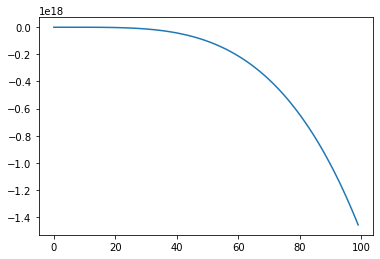

In [ ]:
plt.plot(hist_3.history['val_loss'])

In [ ]:
plt.plot(hist_3.history['accuracy'])
plt.plot(hist_3.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')
plt.show()

In [ ]:
model_2 = Sequential([
    Dense(1000, activation='relu', input_shape=(1000,)),
    Dense(1000, activation='relu'),
    Dense(1000, activation='relu'),
    Dense(1000, activation='relu'),
    Dense(1, activation='sigmoid'),
])

model_2.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
              
hist_2 = model_2.fit(trX, trY,
          batch_size=32, epochs=100,
          validation_data=(vX, vY))

plt.plot(hist_2.history['loss'])
plt.plot(hist_2.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()


In [ ]:
plt.plot(hist_2.history['accuracy'])
plt.plot(hist_2.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')
plt.show()

In [ ]:
model = Sequential([
    Dense(2000, activation='relu', input_shape=(1000,)),
    Dense(2000, activation='relu'),
    Dense(1, activation='sigmoid'),
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
trX=pd.DataFrame(trX)
trY=pd.DataFrame(trY)

vX=pd.DataFrame(vX)
vY=pd.DataFrame(vY)
tX=pd.DataFrame(tX)
tY=pd.DataFrame(tY)
hist = model.fit(trX, trY,
          batch_size=20, epochs=100,
          validation_data=(vX, vY))

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

In [ ]:
hist.history['loss']

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')
plt.show()

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower right')
plt.show()

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN, Flatten
from keras.layers.embeddings import Embedding
from keras.layers.convolutional import Conv1D, MaxPooling1D
from numpy import loadtxt
from keras.layers import Dense

trX, trY,tX, tY, vX, vY=PreModel(train_dat, STOPWORDS,'Text',  Label='Dominant_Topic')

max_review_length = 1000
vocabulary_size = 500
embedding_dim=500#
# Fully connected neural network
model_ffn = Sequential()
model_ffn.add(Dense(2000, activation='relu',input_dim=max_review_length)) #250
model_ffn.add(Dense(2000, activation='relu'))
model_ffn.add(Dense(2000, activation='relu'))
model_ffn.add(Dense(1, activation='sigmoid'))
model_ffn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
#history_ffn=model_ffn.fit(tX, tY, epochs=150, batch_size=10)
trX=pd.DataFrame(trX)
trY=pd.DataFrame(trY)
history_ffn = model_ffn.fit(trX, trY, epochs=150, batch_size=20, verbose=2)
train_scores_ffn=model_ffn.evaluate(trX, trY, verbose=0)

vX=pd.DataFrame(vX)
vY=pd.DataFrame(vY)
validation_scores_ffn = model_ffn.evaluate(vX, vY, verbose=0)


tX=pd.DataFrame(tX)
tY=pd.DataFrame(tY)
test_scores_ffn = model_ffn.evaluate(tX, tY, verbose=0)


[100*train_scores_ffn[1],100*validation_scores_ffn[1],100*test_scores_ffn[1]]


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN, Flatten
from keras.layers.embeddings import Embedding
from keras.layers.convolutional import Conv1D, MaxPooling1D
import pandas as pd

max_review_length = 1000
vocabulary_size = 500
embedding_dim=500#
# Convolutional neural network
model_cnn = Sequential()
model_cnn.add(Embedding(vocabulary_size, embedding_dim, input_length=max_review_length))
model_cnn.add(Conv1D(filters=200, kernel_size=3, padding='same', activation='relu'))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(250, activation='relu'))
model_cnn.add(Dense(1, activation='sigmoid'))
model_cnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
trX=pd.DataFrame(trX)
trY=pd.DataFrame(trY)
history_cnn = model_cnn.fit(trX, trY, verbose=2)

train_scores_ffn=model_cnn.evaluate(trX, trY, verbose=0)

vX=pd.DataFrame(vX)
vY=pd.DataFrame(vY)
validation_scores_ffn = model_cnn.evaluate(vX, vY, verbose=0)


tX=pd.DataFrame(tX)
tY=pd.DataFrame(tY)
test_scores_ffn = model_cnn.evaluate(tX, tY, verbose=0)


[100*train_scores_ffn[1],100*validation_scores_ffn[1],100*test_scores_ffn[1]]


67/67 - 90s - loss: -4.1390e+05 - accuracy: 0.0850


[8.501643687486649, 8.114035427570343, 7.439824938774109]

In [ ]:
# Convolutional + Recurrent Neural Network
model_cnn_rnn = Sequential()
model_cnn_rnn.add(Embedding(vocabulary_size, embedding_dim, input_length=max_review_length))
model_cnn_rnn.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model_cnn_rnn.add(MaxPooling1D(pool_size=2))
model_cnn_rnn.add(SimpleRNN(100))
model_cnn_rnn.add(Dense(1, activation='sigmoid'))
model_cnn_rnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

trX=pd.DataFrame(trX)
trY=pd.DataFrame(trY)
history_rnn = model_rnn.fit(trX, trY, epochs=3, batch_size=64)

train_scores_ffn=model_cnn.evaluate(trX, trY, verbose=0)

vX=pd.DataFrame(vX)
vY=pd.DataFrame(vY)
validation_scores_ffn = model_cnn.evaluate(vX, vY, verbose=0)


tX=pd.DataFrame(tX)
tY=pd.DataFrame(tY)
test_scores_ffn = model_cnn.evaluate(tX, tY, verbose=0)


[100*train_scores_ffn[1],100*validation_scores_ffn[1],100*test_scores_ffn[1]]



Epoch 1/3
34/34 [==============================] - 40s 1s/step - loss: -82.0553 - accuracy: 0.0892
Epoch 2/3
34/34 [==============================] - 40s 1s/step - loss: -95.3004 - accuracy: 0.0892
Epoch 3/3
34/34 [==============================] - 40s 1s/step - loss: -108.2234 - accuracy: 0.0892


[8.924377709627151, 5.921052768826485, 7.658643275499344]

In [ ]:
max_review_length = 1000
vocabulary_size = 500
embedding_dim=500#

# Recurrent Neural Network
model_rnn = Sequential()
model_rnn.add(Embedding(vocabulary_size, embedding_dim, input_length=max_review_length))
model_rnn.add(SimpleRNN(100))
model_rnn.add(Dense(1, activation='sigmoid'))
model_rnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

trX=pd.DataFrame(trX)
trY=pd.DataFrame(trY)
history_rnn = model_rnn.fit(trX, trY, epochs=3, batch_size=64)

train_scores_ffn=model_cnn.evaluate(trX, trY, verbose=0)

vX=pd.DataFrame(vX)
vY=pd.DataFrame(vY)
validation_scores_ffn = model_cnn.evaluate(vX, vY, verbose=0)


tX=pd.DataFrame(tX)
tY=pd.DataFrame(tY)
test_scores_ffn = model_cnn.evaluate(tX, tY, verbose=0)


[100*train_scores_ffn[1],100*validation_scores_ffn[1],100*test_scores_ffn[1]]


Epoch 1/3
34/34 [==============================] - 49s 1s/step - loss: -13.3138 - accuracy: 0.0877
Epoch 2/3
34/34 [==============================] - 40s 1s/step - loss: -49.6270 - accuracy: 0.0835
Epoch 3/3
34/34 [==============================] - 40s 1s/step - loss: -63.8765 - accuracy: 0.0890


[8.924377709627151, 5.921052768826485, 7.658643275499344]

In [ ]:

[100*train_scores_ffn[1],100*validation_scores_ffn[1],100*test_scores_ffn[1]]

[8.17285105586052, 8.114035427570343, 8.971553295850754]

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN, Flatten
from keras.layers.embeddings import Embedding
from keras.layers.convolutional import Conv1D, MaxPooling1D
import pandas as pd

max_review_length = 500
vocabulary_size = 500
embedding_dim=500#
# Fully connected neural network
model_ffn = Sequential()
model_ffn.add(Dense(250, activation='relu',input_dim=max_review_length))
model_ffn.add(Dense(1, activation='sigmoid'))
model_ffn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

history_ffn = model_ffn.fit([tX, pd.DataFrame(tY)])
#(tX, tY, epochs=20, batch_size=128, verbose=2)
#history_ffn = model_ffn.fit(tX, tY, verbose=2)
#scores_ffn = model_ffn.evaluate(vX, vY, verbose=0)

# Fully connected neural network with embeddings
model_ffne = Sequential()
model_ffne.add(Embedding(vocabulary_size, embedding_dim, input_length=max_review_length))
model_ffne.add(Flatten())
model_ffne.add(Dense(250, activation='relu'))
model_ffne.add(Dense(1, activation='sigmoid'))
model_ffne.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
history_ffne = model_ffne.fit(tX, tY, epochs=20, batch_size=128, verbose=2)
scores_ffne = model_ffne.evaluate(vX, vY, verbose=0)

# Convolutional neural network
model_cnn = Sequential()
model_cnn.add(Embedding(vocabulary_size, embedding_dim, input_length=max_review_length))
model_cnn.add(Conv1D(filters=200, kernel_size=3, padding='same', activation='relu'))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(250, activation='relu'))
model_cnn.add(Dense(1, activation='sigmoid'))
model_cnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
history_cnn = model_cnn.fit(tX, tY, verbose=2)
scores_cnn = model_cnn.evaluate(vX, vY, verbose=0)


# Recurrent Neural Network
model_rnn = Sequential()
model_rnn.add(Embedding(vocabulary_size, embedding_dim, input_length=max_review_length))
model_rnn.add(SimpleRNN(100))
model_rnn.add(Dense(1, activation='sigmoid'))
model_rnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
history_rnn = model_rnn.fit(tX, tY, epochs=3, batch_size=64)
scores_rnn = model_rnn.evaluate(vX, vY, verbose=0)

# Convolutional + Recurrent Neural Network
model_cnn_rnn = Sequential()
model_cnn_rnn.add(Embedding(vocabulary_size, embedding_dim, input_length=max_review_length))
model_cnn_rnn.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model_cnn_rnn.add(MaxPooling1D(pool_size=2))
model_cnn_rnn.add(SimpleRNN(100))
model_cnn_rnn.add(Dense(1, activation='sigmoid'))
model_cnn_rnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
history_cnn_rnn = model_cnn_rnn.fit(tX, tY, epochs=10, batch_size=64)
scores_cnn_rnn = model_cnn_rnn.evaluate(vX, vY, verbose=0)

# Evaluation
df = pd.DataFrame({'Model': ['FFNN', 'FFNN with Embeddings', 'CNN', 'RNN', 'CNN+RNN'],
                   'Accuracy': [str(round(scores_ffn[1]*100, 2)) + '%',
                                str(round(scores_ffne[1]*100, 2)) + '%',
                                str(round(scores_cnn[1]*100, 2)) + '%',
                                str(round(scores_rnn[1]*100, 2)) + '%',
                                str(round(scores_cnn_rnn[1]*100, 2)) + '%']})
df

In [ ]:

#LDA_gensm_dominant_topics10=LDA_gensm_dominant_topics10[['Document_No',	'Dominant_Topic',	'Topic_Perc_Contrib',	'Keywords',	'Text']]
temp=[(len(LDA_gensm_dominant_topics10['Keywords'][i]),len(LDA_gensm_dominant_topics10['Text'][i]),round(LDA_gensm_dominant_topics10['Topic_Perc_Contrib'][i],4)) for i in range(LDA_gensm_dominant_topics10.shape[0])]

#len(LDA_gensm_dominant_topics10['Text'][1]),len(LDA_gensm_dominant_topics10['Keywords'][1])
#LDA_gensm_dominant_topics10.shape[0]